**Created by Berkay Alan**

**Kodluyoruz Data Science 102 Bootcamp Plant Pathology Project**

**31 October,2020**

In [101]:
import torch
import torch.nn
from torchvision.transforms import ToTensor, ToPILImage

import numpy as np
import pandas as pd
import plotly.express as px
from PIL import Image
from pathlib import Path

In [102]:
import seaborn as sns
from tqdm import tqdm
import matplotlib.cm as cm
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

In [103]:
import cv2
from io import BytesIO
from PIL import Image

# skimage
from skimage.io import imshow, imread, imsave
from skimage.transform import rotate, AffineTransform, warp,rescale, resize, downscale_local_mean
from skimage import color,data
from skimage.exposure import adjust_gamma
from skimage.util import random_noise

#plotly
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot 
import plotly.graph_objs as go
import plotly.offline as py
py.init_notebook_mode(connected=True)

# 3D scatter plot
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors


In [104]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

np.random.seed(0)

import warnings
warnings.filterwarnings("ignore")

In [105]:
EPOCHS = 20
SAMPLE_LEN = 100

IMAGE_PATH = "plant-pathology-2020-fgvc7/images/"
TEST_PATH = "plant-pathology-2020-fgvc7/test.csv"
TRAIN_PATH = "plant-pathology-2020-fgvc7/train.csv"
SUB_PATH = "plant-pathology-2020-fgvc7/sample_submission.csv"
PATH = Path("plant-pathology-2020-fgvc7/")
PATH

WindowsPath('plant-pathology-2020-fgvc7')

In [106]:
sub = pd.read_csv(SUB_PATH)
test_data = pd.read_csv(TEST_PATH)
train_data = pd.read_csv(TRAIN_PATH)
train_df=train_data

In [107]:
train_data.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [108]:
test_data.head()

,image_id
0,Test_0
1,Test_1
2,Test_2
3,Test_3
4,Test_4


In [109]:
def load_image(image_id):
    file_path = image_id + ".jpg"
    image = cv2.imread(IMAGE_PATH + file_path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

train_images = train_data["image_id"][:SAMPLE_LEN].progress_apply(load_image)

100%|██████████| 100/100 [00:48<00:00,  2.05it/s]



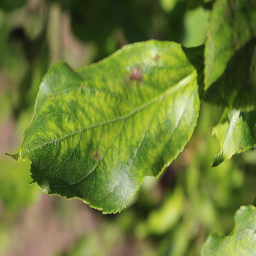

In [110]:
fig = px.imshow(cv2.resize(train_images[0], (256, 256)))
fig.show()

In [111]:
red_values = [np.mean(train_images[idx][:, :, 0]) for idx in range(len(train_images))]
green_values = [np.mean(train_images[idx][:, :, 1]) for idx in range(len(train_images))]
blue_values = [np.mean(train_images[idx][:, :, 2]) for idx in range(len(train_images))]
values = [np.mean(train_images[idx]) for idx in range(len(train_images))]

In [112]:
fig = ff.create_distplot([values], group_labels=["Channels"], colors=["purple"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Distribution of channel values")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

In [113]:
fig = ff.create_distplot([red_values], group_labels=["R"], colors=["red"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Distribution of red channel values")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

In [114]:
fig = ff.create_distplot([green_values], group_labels=["G"], colors=["green"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Distribution of green channel values")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

In [115]:
fig = ff.create_distplot([blue_values], group_labels=["B"], colors=["blue"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Distribution of blue channel values")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

In [116]:
fig = go.Figure()

for idx, values in enumerate([red_values, green_values, blue_values]):
    if idx == 0:
        color = "Red"
    if idx == 1:
        color = "Green"
    if idx == 2:
        color = "Blue"
    fig.add_trace(go.Box(x=[color]*len(values), y=values, name=color, marker=dict(color=color.lower())))
    
fig.update_layout(yaxis_title="Mean value", xaxis_title="Color channel",
                  title="Mean value vs. Color channel", template="plotly_white")

In [118]:
fig = ff.create_distplot([red_values, green_values, blue_values],
                         group_labels=["R", "G", "B"],
                         colors=["red", "green", "blue"])
fig.update_layout(title_text="Distribution of red channel values", template="simple_white")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig.data[1].marker.line.color = 'rgb(0, 0, 0)'
fig.data[1].marker.line.width = 0.5
fig.data[2].marker.line.color = 'rgb(0, 0, 0)'
fig.data[2].marker.line.width = 0.5
fig

In [119]:
def visualize_leaves(cond=[0, 0, 0, 0], cond_cols=["healthy"], is_cond=True):
    if not is_cond:
        cols, rows = 3, min([3, len(train_images)//3])
        fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(30, rows*20/3))
        for col in range(cols):
            for row in range(rows):
                ax[row, col].imshow(train_images.loc[train_images.index[-row*3-col-1]])
        return None
        
    cond_0 = "healthy == {}".format(cond[0])
    cond_1 = "scab == {}".format(cond[1])
    cond_2 = "rust == {}".format(cond[2])
    cond_3 = "multiple_diseases == {}".format(cond[3])
    
    cond_list = []
    for col in cond_cols:
        if col == "healthy":
            cond_list.append(cond_0)
        if col == "scab":
            cond_list.append(cond_1)
        if col == "rust":
            cond_list.append(cond_2)
        if col == "multiple_diseases":
            cond_list.append(cond_3)
    
    data = train_data.loc[:100]
    for cond in cond_list:
        data = data.query(cond)
        
    images = train_images.loc[list(data.index)]
    cols, rows = 3, min([3, len(images)//3])
    
    fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(30, rows*20/3))
    for col in range(cols):
        for row in range(rows):
            ax[row, col].imshow(images.loc[images.index[row*3+col]])
    plt.show()

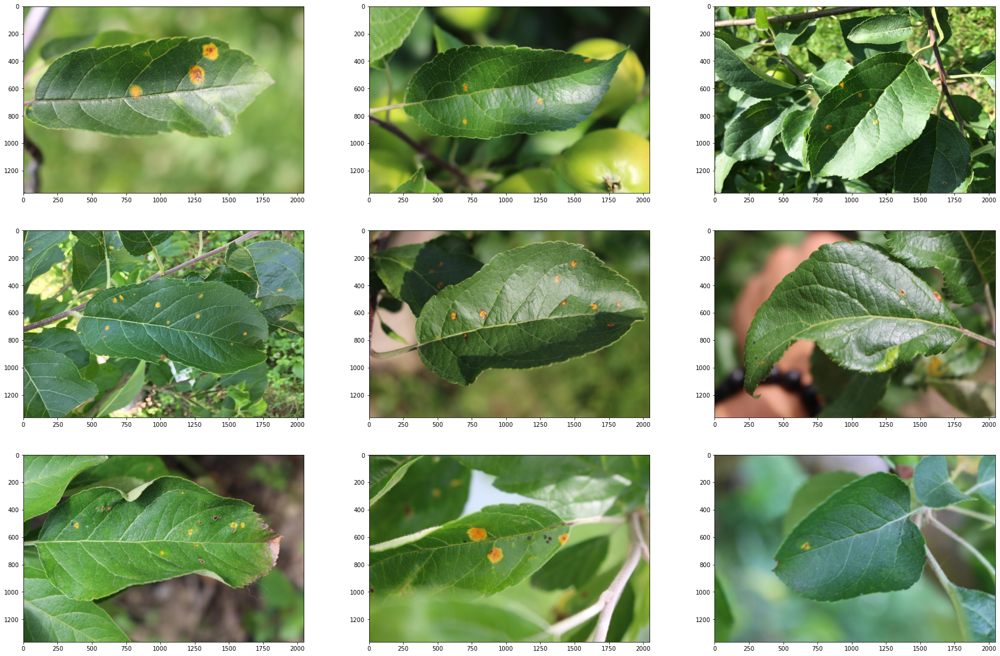

In [120]:
visualize_leaves(cond=[0, 0, 1, 0], cond_cols=["rust"])

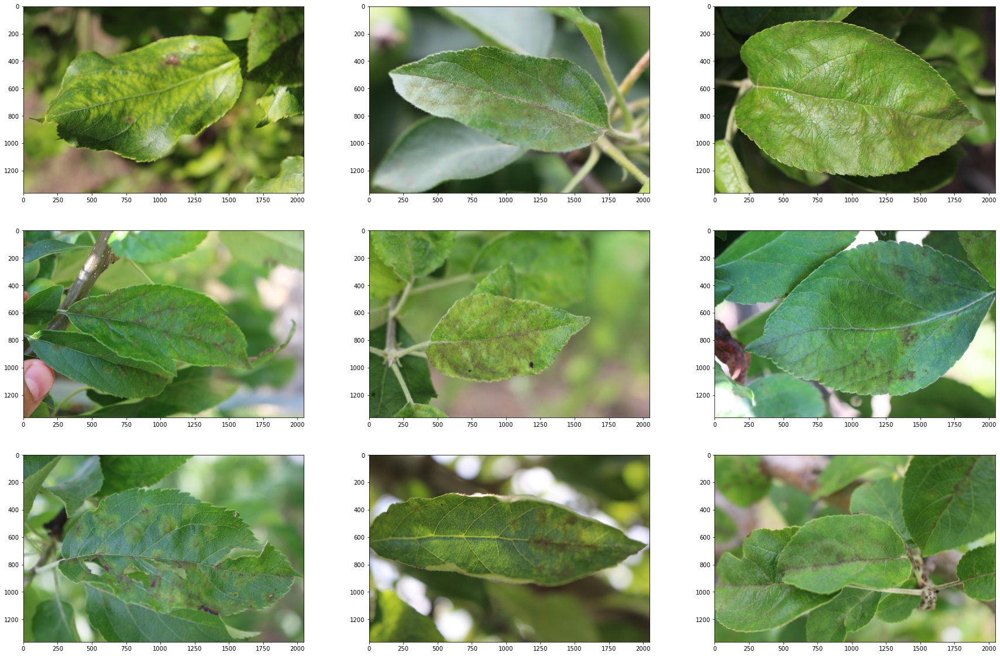

In [121]:
visualize_leaves(cond=[0, 1, 0, 0], cond_cols=["scab"])

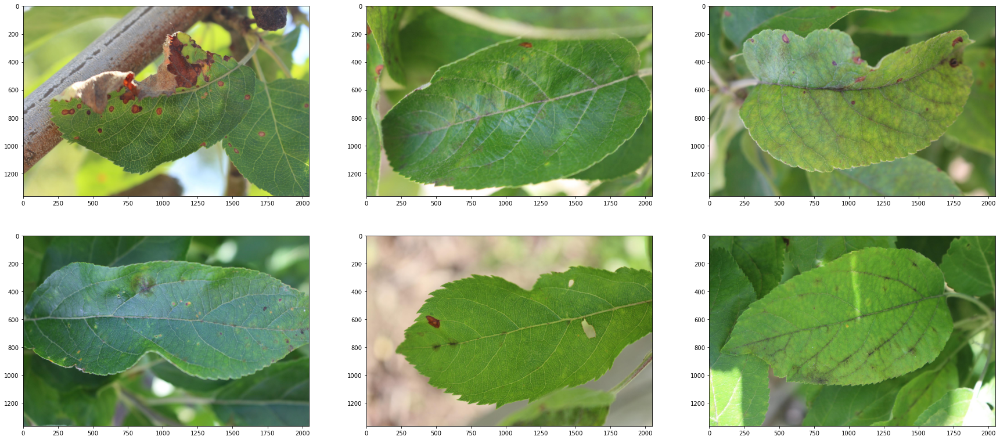

In [122]:
visualize_leaves(cond=[0, 0, 0, 1], cond_cols=["multiple_diseases"])

In [123]:
fig = px.parallel_categories(train_data[["healthy", "scab", "rust", "multiple_diseases"]], color="healthy", color_continuous_scale="sunset",\
                             title="Parallel categories plot of targets")
fig

In [132]:
fig = go.Figure([go.Pie(labels=train_data.columns[1:],
           values=train_data.iloc[:, 1:].sum().values)])
fig.update_layout(title_text="Pie chart of targets", template="simple_white")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig.show()

In [133]:
train_data["Healthy"] = train_data["healthy"].apply(bool).apply(str)
fig = px.histogram(train_data, x="Healthy", title="Healthy distribution", color="Healthy",\
            color_discrete_map={
                "True": px.colors.qualitative.Plotly[0],
                "False": px.colors.qualitative.Plotly[1]})
fig.update_layout(template="simple_white")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig.data[1].marker.line.color = 'rgb(0, 0, 0)'
fig.data[1].marker.line.width = 0.5
fig


In [134]:
train_data["Scab"] = train_data["scab"].apply(bool).apply(str)
fig = px.histogram(train_data, x="Scab", color="Scab", title="Scab distribution",\
            color_discrete_map={
                "True": px.colors.qualitative.Plotly[1],
                "False": px.colors.qualitative.Plotly[0]})
fig.update_layout(template="simple_white")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig.data[1].marker.line.color = 'rgb(0, 0, 0)'
fig.data[1].marker.line.width = 0.5
fig


In [135]:
train_data["Rust"] = train_data["rust"].apply(bool).apply(str)
fig = px.histogram(train_data, x="Rust", color="Rust", title="Rust distribution",\
            color_discrete_map={
                "True": px.colors.qualitative.Plotly[1],
                "False": px.colors.qualitative.Plotly[0]})
fig.update_layout(template="simple_white")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig.data[1].marker.line.color = 'rgb(0, 0, 0)'
fig.data[1].marker.line.width = 0.5
fig

In [136]:
train_data["Multiple diseases"] = train_data["multiple_diseases"].apply(bool).apply(str)
fig = px.histogram(train_data, x="Multiple diseases", color="Multiple diseases", title="Multiple diseases distribution",\
            color_discrete_map={
                "True": px.colors.qualitative.Plotly[1],
                "False": px.colors.qualitative.Plotly[0]})
fig.update_layout(template="simple_white")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig.data[1].marker.line.color = 'rgb(0, 0, 0)'
fig.data[1].marker.line.width = 0.5
fig

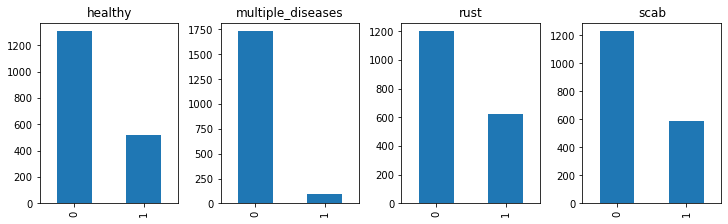

In [137]:
LABEL_COLS = ['healthy', 'multiple_diseases', 'rust', 'scab']
_, axes = plt.subplots(ncols=4, nrows=1, constrained_layout=True, figsize=(10, 3))
for ax, column in zip(axes, LABEL_COLS):
    train_data[column].value_counts().plot.bar(title=column, ax=ax)
plt.show()

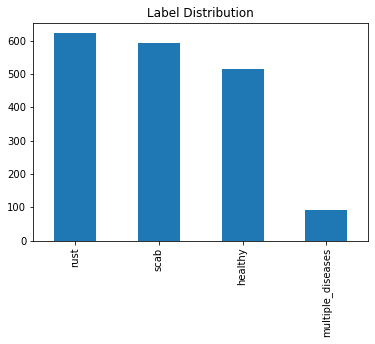

In [138]:
plt.title('Label Distribution')
train_data[LABEL_COLS].idxmax(axis=1).value_counts().plot.bar()

In [139]:
## Img Size Dist
IMG_PATH = PATH / 'images'

def get_size(df):
    hs, ws = [], []
    for _, row in tqdm(df.iterrows(), total=len(train_data)):
        img = Image.open(IMG_PATH/(row.image_id+'.jpg'))
        h, w = img.size
        hs.append(h)
        ws.append(w)
        
    return hs, ws

train_hs, train_ws = get_size(train_data)
test_hs, test_ws = get_size(test_data)

100%|██████████| 1821/1821 [01:36<00:00, 18.90it/s]


train height val counts: Counter({2048: 1819, 1365: 2})
train width val counts: Counter({1365: 1819, 2048: 2})
test height val counts: Counter({2048: 1801, 1365: 20})
test width val counts: Counter({1365: 1801, 2048: 20})


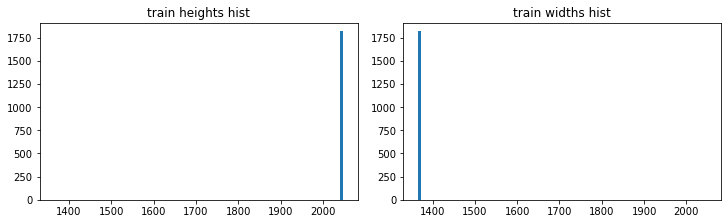

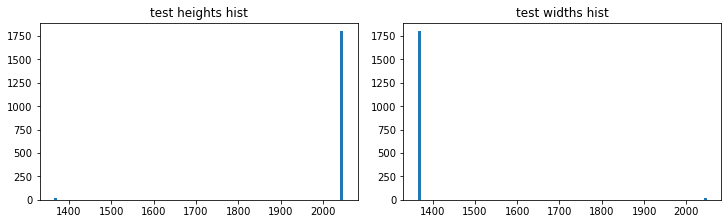

In [140]:
from collections import Counter
for set_label, set_size in ('train', [train_hs, train_ws]), ('test', [test_hs, test_ws]):
    print(f'{set_label} height val counts: {Counter(set_size[0])}')
    print(f'{set_label} width val counts: {Counter(set_size[1])}')

    _, axes = plt.subplots(ncols=2, nrows=1, constrained_layout=True, figsize=(10, 3))
    for ax, column, vals in zip(axes, ['heights', 'widths'], set_size):
        ax.hist(vals, bins=100)
        ax.set_title(f'{set_label} {column} hist')

plt.show()

100%|██████████| 1821/1821 [09:49<00:00,  3.09it/s]


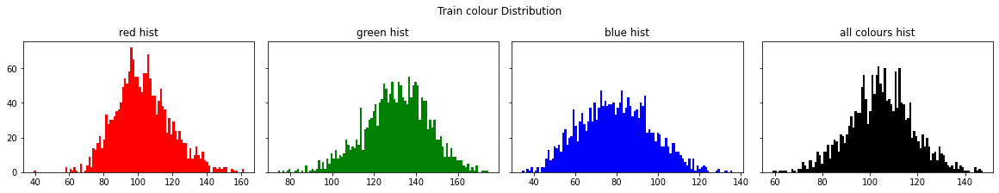

In [141]:
def plot_colour_hist(df, title):
    red_values = []; green_values = []; blue_values = []; all_channels = []
    for _, row in tqdm(df.iterrows(), total=len(df)):
        img = np.array(Image.open(IMG_PATH/(row.image_id+'.jpg')))
        red_values.append(np.mean(img[:, :, 0]))
        green_values.append(np.mean(img[:, :, 1]))
        blue_values.append(np.mean(img[:, :, 2]))
        all_channels.append(np.mean(img))
        
    _, axes = plt.subplots(ncols=4, nrows=1, constrained_layout=True, figsize=(16, 3), sharey=True)
    for ax, column, vals, c in zip(
        axes,
        ['red', 'green', 'blue', 'all colours'],
        [red_values, green_values, blue_values, all_channels],
        'rgbk'
    ):
        ax.hist(vals, bins=100, color=c)
        ax.set_title(f'{column} hist')

    plt.suptitle(title)
    plt.show()
plot_colour_hist(train_data, title='Train colour Distribution')

100%|██████████| 1821/1821 [06:27<00:00,  4.70it/s]


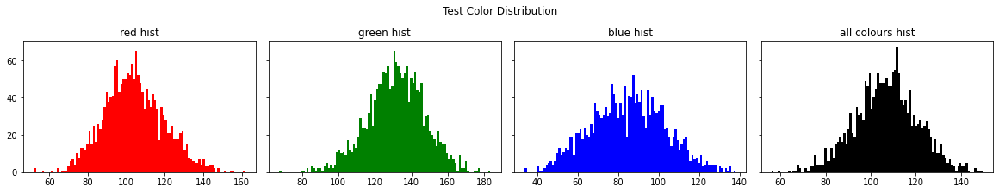

In [142]:
plot_colour_hist(test_data, title='Test Color Distribution')

In [143]:
def show_images(image_ids):
    
    col = 5
    row = min(len(image_ids) // col, 5)
    
    fig, ax = plt.subplots(row, col, figsize=(16, 8))
    ax = ax.flatten()

    for i, image_id in enumerate(image_ids):
        image = cv2.imread(TRAIN_PATH + '/images/{}.jpg'.format(image_id))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        ax[i].set_axis_off()
        ax[i].imshow(image)
        ax[i].set_title(image_id)

In [144]:
fig = go.Figure(data=[
    go.Pie(labels=train_data.columns[1:],
           values=train_data.iloc[:, 1:].sum().values)
])
fig.show()

In [152]:
train_df=train_data
classes = ['healthy', 'multiple_diseases', 'rust', 'scab']
COLORS = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#93D30C", "#8F00FF"]
healthy = train_df[train_df['healthy'] == 1]['image_id'].to_list()
multiple_diseases = train_df[train_df['multiple_diseases'] == 1]['image_id'].to_list()
rust = train_df[train_df['rust'] == 1]['image_id'].to_list()
scab = train_df[train_df['scab'] == 1]['image_id'].to_list()

diseases = [len(healthy), len(multiple_diseases), len(rust), len(scab)]
trace = go.Bar(
                    x = classes,
                    y = diseases ,
                    orientation='v',
                    marker = dict(color=COLORS,
                                 line=dict(color='black',width=1)),
                    )
data = [trace]
layout = go.Layout(barmode = "group",title='Leaf Category Distribution',width=800, height=500, 
                       xaxis= dict(title='Leaf Categories'),
                       yaxis=dict(title="Count"),
                       showlegend=False)
fig = go.Figure(data = data, layout = layout)
iplot(fig)

In [151]:
shuffled_train_data = pd.read_csv("data/shuffled_train.csv")
classes = ['healthy', 'multiple_diseases', 'rust', 'scab']
COLORS = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#93D30C", "#8F00FF"]
healthy = shuffled_train_data[shuffled_train_data['healthy'] == 1]['image_id'].to_list()
multiple_diseases = shuffled_train_data[shuffled_train_data['multiple_diseases'] == 1]['image_id'].to_list()
rust = shuffled_train_data[shuffled_train_data['rust'] == 1]['image_id'].to_list()
scab = shuffled_train_data[shuffled_train_data['scab'] == 1]['image_id'].to_list()

diseases = [len(healthy), len(multiple_diseases), len(rust), len(scab)]
trace = go.Bar(
                    x = classes,
                    y = diseases ,
                    orientation='v',
                    marker = dict(color=COLORS,
                                 line=dict(color='black',width=1)),
                    )
data = [trace]
layout = go.Layout(barmode = "group",title='Shuffled Leaf Category Distribution',width=800, height=500, 
                       xaxis= dict(title=' Shuffled Leaf Categories'),
                       yaxis=dict(title="Count"),
                       showlegend=False)
fig = go.Figure(data = data, layout = layout)
iplot(fig)

Display Random Images


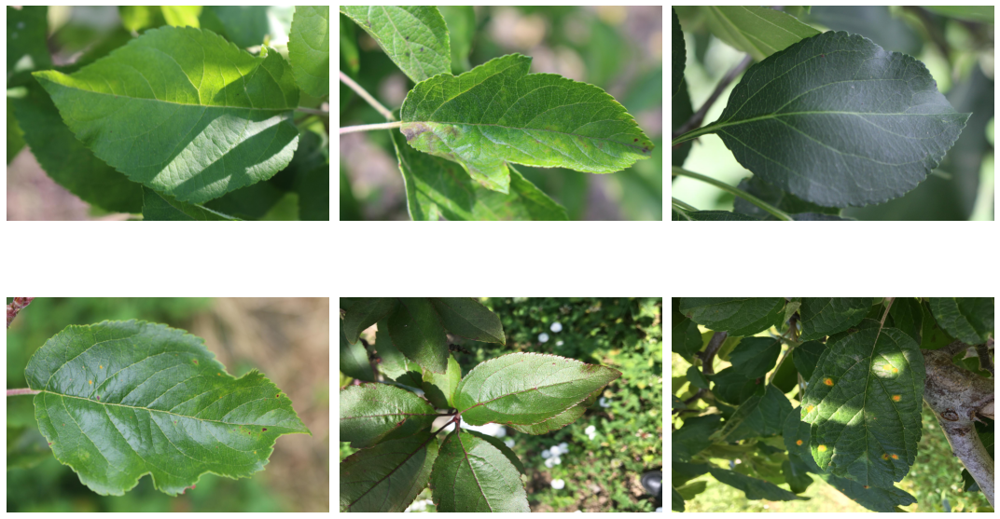

In [146]:
# Display Random Images
import os
images = train_df['image_id'].values

# Extract 9 random images from it
random_images = [np.random.choice(images+'.jpg') for i in range(6)]

# Location of the image dir
img_dir = IMAGE_PATH

print('Display Random Images')

# Adjust the size of your images
plt.figure(figsize=(15,10))

# Iterate and plot random images
for i in range(6):
    plt.subplot(2, 3, i + 1)
    img = plt.imread(os.path.join(img_dir, random_images[i]))
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    
# Adjust subplot parameters to give specified padding
plt.tight_layout()   

In [147]:
def display_images(images, Image_dir, condition):
    random_images = [np.random.choice(images+'.jpg') for i in range(6)]

    print(f"Display {condition} Images")

   # Adjust the size of your images
    plt.figure(figsize=(15,10))

  # Iterate and plot random images
    for i in range(6):
        plt.subplot(2, 3, i + 1)
        img = plt.imread(os.path.join(img_dir, random_images[i]))
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    
# Adjust subplot parameters to give specified padding
    plt.tight_layout()   
    

Display healthy Images


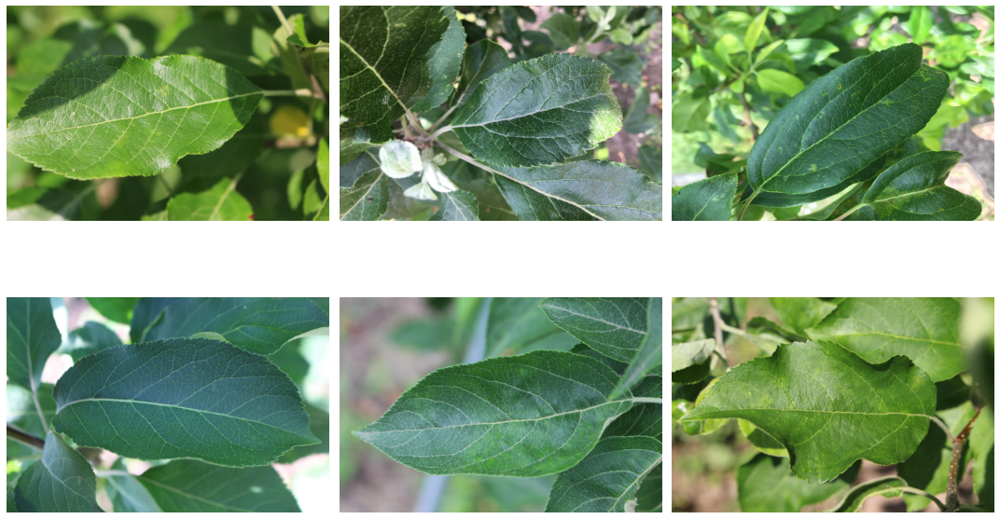

In [148]:
healthy_images = np.array(healthy,dtype='object')
images = healthy_images
display_images(images,IMAGE_PATH,'healthy')

Display rust Images


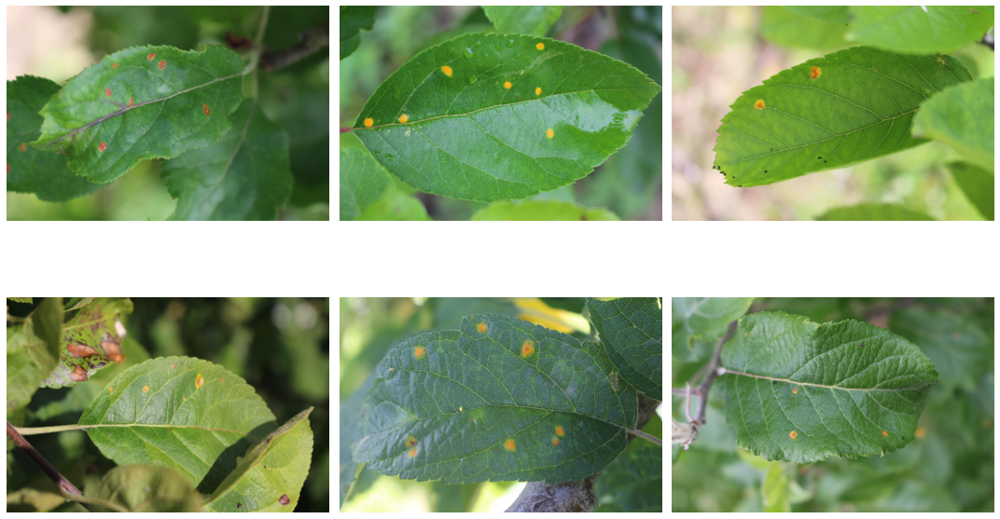

In [92]:
rust_images = np.array(rust,dtype='object')
images = rust_images
display_images(images,IMAGE_PATH,'rust')

Display scab Images


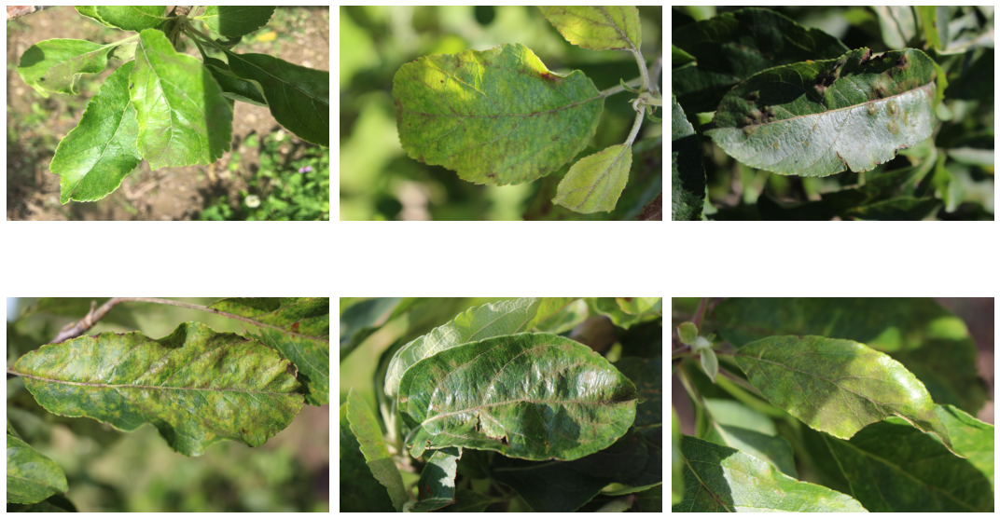

In [93]:
scab_images = np.array(scab,dtype='object')
images = scab_images
display_images(images,IMAGE_PATH,'scab')

Display multiple_diseases Images


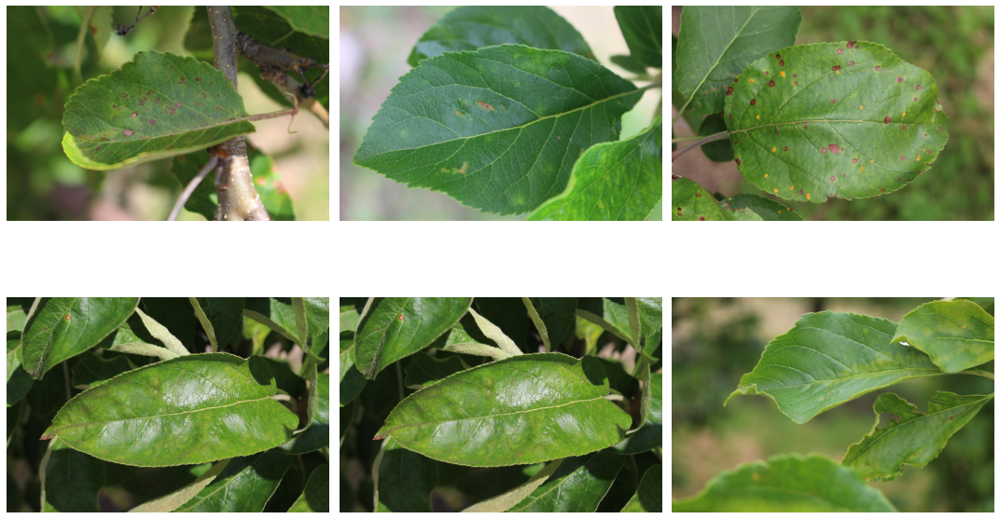

In [94]:
multiple_diseases_images = np.array(multiple_diseases,dtype='object')
images = multiple_diseases_images
display_images(images,IMAGE_PATH,'multiple_diseases')

Image dimensions:  (1365, 2048)
Maximum pixel value : 255.0 ; Minimum pixel value:6.0
Mean value of the pixels : 119.9 ; Standard deviation : 63.3


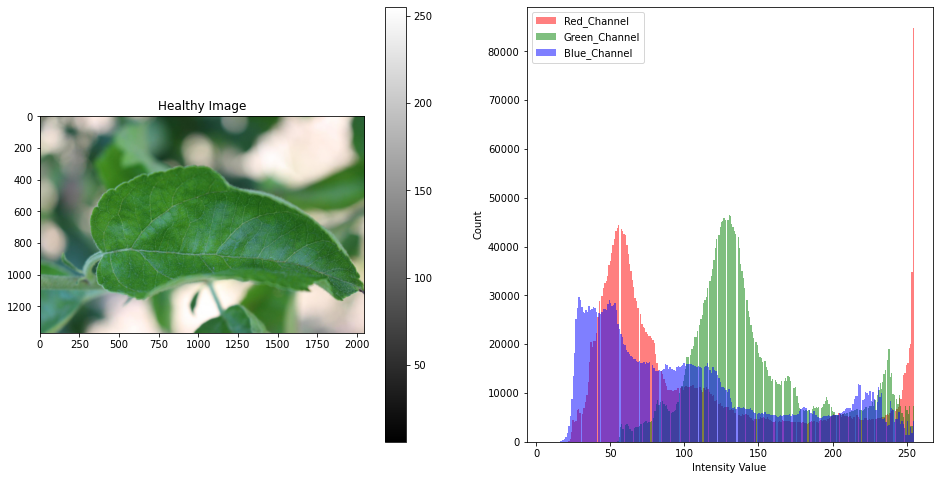

In [95]:
f = plt.figure(figsize=(16,8))
f.add_subplot(1,2, 1)

sample_img = healthy[0]+'.jpg'
raw_image = plt.imread(os.path.join(img_dir, sample_img))
plt.imshow(raw_image, cmap='gray')
plt.colorbar()
plt.title('Healthy Image')
print(f"Image dimensions:  {raw_image.shape[0],raw_image.shape[1]}")
print(f"Maximum pixel value : {raw_image.max():.1f} ; Minimum pixel value:{raw_image.min():.1f}")
print(f"Mean value of the pixels : {raw_image.mean():.1f} ; Standard deviation : {raw_image.std():.1f}")

f.add_subplot(1,2, 2)

#_ = plt.hist(raw_image.ravel(),bins = 256, color = 'orange',)
_ = plt.hist(raw_image[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
_ = plt.hist(raw_image[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
_ = plt.hist(raw_image[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
_ = plt.xlabel('Intensity Value')
_ = plt.ylabel('Count')
_ = plt.legend(['Red_Channel', 'Green_Channel', 'Blue_Channel'])
plt.show()

Image dimensions:  (1365, 2048)
Maximum pixel value : 255.0 ; Minimum pixel value:6.0
Mean value of the pixels : 119.9 ; Standard deviation : 63.3


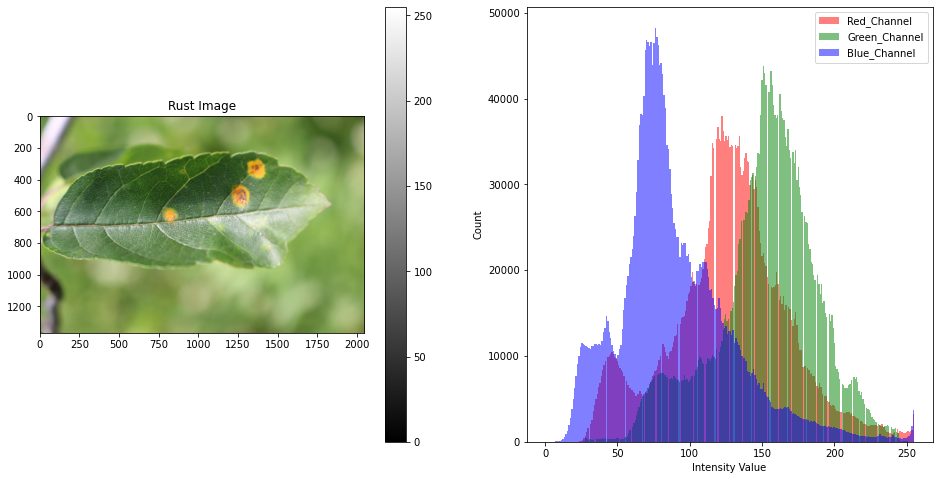

In [96]:
f = plt.figure(figsize=(16,8))
f.add_subplot(1,2, 1)

rust_img = rust[0]+'.jpg'
rust_image = plt.imread(os.path.join(img_dir, rust_img))
plt.imshow(rust_image, cmap='gray')
plt.colorbar()
plt.title('Rust Image')
print(f"Image dimensions:  {raw_image.shape[0],raw_image.shape[1]}")
print(f"Maximum pixel value : {raw_image.max():.1f} ; Minimum pixel value:{raw_image.min():.1f}")
print(f"Mean value of the pixels : {raw_image.mean():.1f} ; Standard deviation : {raw_image.std():.1f}")

f.add_subplot(1,2, 2)
#_ = plt.hist(raw_image.ravel(),bins = 256, color = 'orange',)
_ = plt.hist(rust_image[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
_ = plt.hist(rust_image[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
_ = plt.hist(rust_image[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
_ = plt.xlabel('Intensity Value')
_ = plt.ylabel('Count')
_ = plt.legend(['Red_Channel', 'Green_Channel', 'Blue_Channel'])
plt.show()

Image dimensions:  (1365, 2048)
Maximum pixel value : 255.0 ; Minimum pixel value:6.0
Mean value of the pixels : 119.9 ; Standard deviation : 63.3


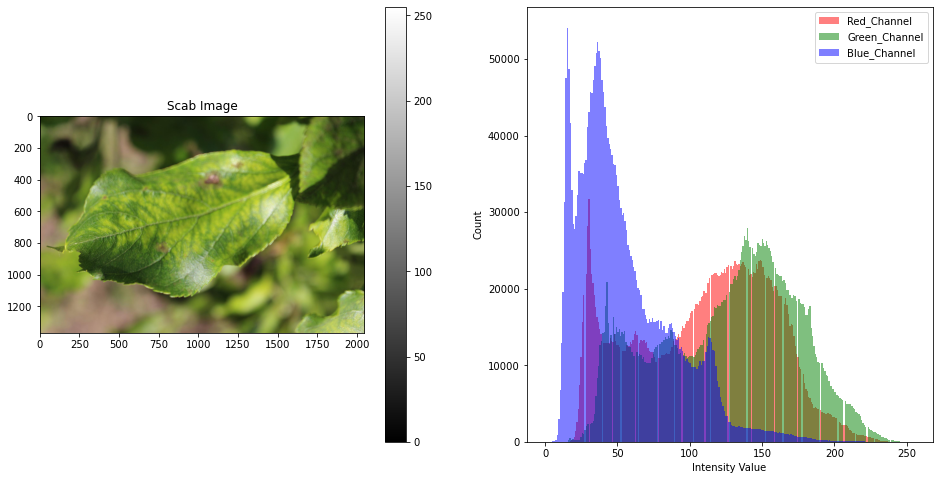

In [97]:
f = plt.figure(figsize=(16,8))
f.add_subplot(1,2, 1)

scab_img = scab[0]+'.jpg'
scab_image = plt.imread(os.path.join(img_dir, scab_img))
plt.imshow(scab_image, cmap='gray')
plt.colorbar()
plt.title('Scab Image')
print(f"Image dimensions:  {raw_image.shape[0],raw_image.shape[1]}")
print(f"Maximum pixel value : {raw_image.max():.1f} ; Minimum pixel value:{raw_image.min():.1f}")
print(f"Mean value of the pixels : {raw_image.mean():.1f} ; Standard deviation : {raw_image.std():.1f}")

f.add_subplot(1,2, 2)
#Kaynak: https://towardsdatascience.com/histograms-in-image-processing-with-skimage-python-be5938962935
#_ = plt.hist(raw_image.ravel(),bins = 256, color = 'orange',)
_ = plt.hist(scab_image[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
_ = plt.hist(scab_image[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
_ = plt.hist(scab_image[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
_ = plt.xlabel('Intensity Value')
_ = plt.ylabel('Count')
_ = plt.legend(['Red_Channel', 'Green_Channel', 'Blue_Channel'])
plt.show()

Image dimensions:  (1365, 2048)
Maximum pixel value : 255.0 ; Minimum pixel value:6.0
Mean value of the pixels : 119.9 ; Standard deviation : 63.3


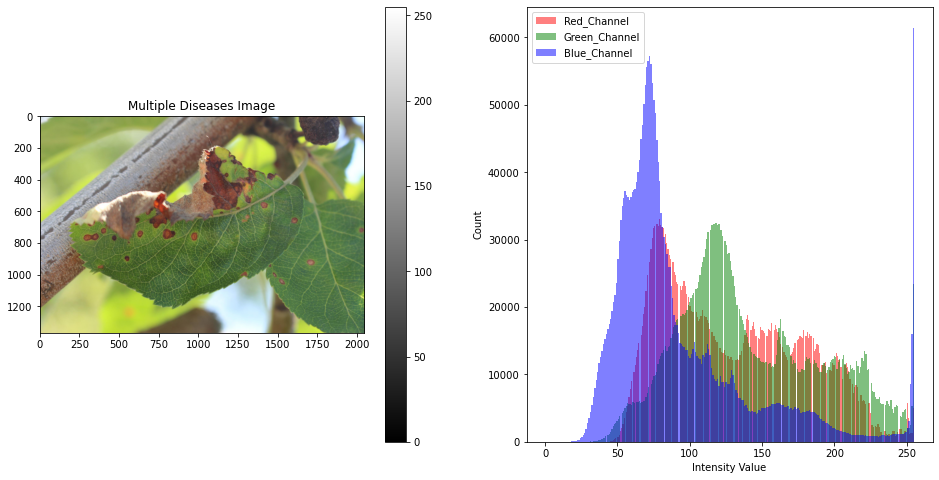

In [98]:
f = plt.figure(figsize=(16,8))
f.add_subplot(1,2, 1)

multiple_diseases_img = multiple_diseases[0]+'.jpg'
multiple_diseases_image = plt.imread(os.path.join(img_dir, multiple_diseases_img))
plt.imshow(multiple_diseases_image, cmap='gray')
plt.colorbar()
plt.title('Multiple Diseases Image')
print(f"Image dimensions:  {raw_image.shape[0],raw_image.shape[1]}")
print(f"Maximum pixel value : {raw_image.max():.1f} ; Minimum pixel value:{raw_image.min():.1f}")
print(f"Mean value of the pixels : {raw_image.mean():.1f} ; Standard deviation : {raw_image.std():.1f}")

f.add_subplot(1,2, 2)

_ = plt.hist(multiple_diseases_image[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
_ = plt.hist(multiple_diseases_image[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
_ = plt.hist(multiple_diseases_image[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
_ = plt.xlabel('Intensity Value')
_ = plt.ylabel('Count')
_ = plt.legend(['Red_Channel', 'Green_Channel', 'Blue_Channel'])
plt.show()

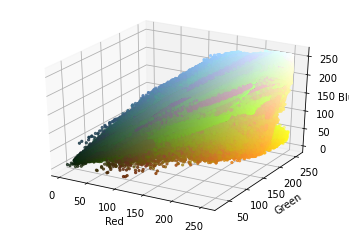

In [99]:
r, g, b = cv2.split(img)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")

pixel_colors = img.reshape((np.shape(img)[0]*np.shape(img)[1], 3))
norm = colors.Normalize(vmin=-1.,vmax=1.)
norm.autoscale(pixel_colors)
pixel_colors = norm(pixel_colors).tolist()

axis.scatter(r.flatten(), g.flatten(), b.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Red")
axis.set_ylabel("Green")
axis.set_zlabel("Blue")
plt.show()


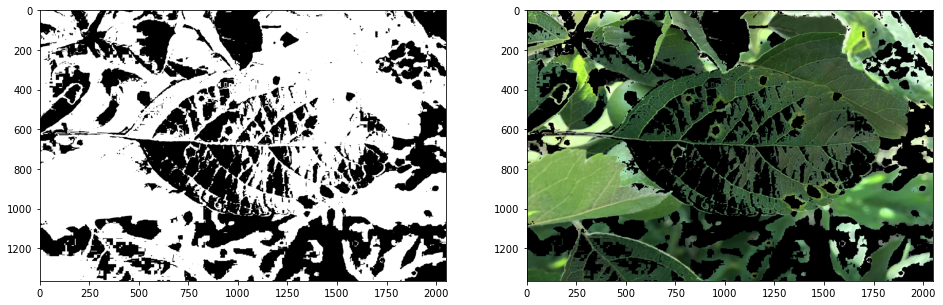

In [100]:
# Image Masking
hsv_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
boundaries = [([30,0,0],[70,255,255])]
mask = cv2.inRange(hsv_image, (36, 0, 0), (70, 255,255))
result = cv2.bitwise_and(img, img, mask=mask)

plt.figure(figsize=(16,8))
plt.subplot(1, 2, 1)
plt.imshow(mask, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(result)
plt.show()